## Experimental stuff, not the cleanest code you'll see

---



In [12]:
import cv2 
import torch
import random
import numpy as np
import torch.nn as nn 
import torch.optim as optim
import imageio
import torch.nn.functional as F
import matplotlib.pyplot as plt 
from IPython.display import Image, HTML, clear_output

## The model class


In [3]:
class ca_model(nn.Module):
    def __init__(self, checkpoint = None, seq_layers = None, device = 'cuda'):
        '''
        Kind of a modular class for a CA model
        args:
            checkpoint = 'path/to/model.pt'
            seq_layers = nn.Sequential(your, pytorch, layers)
            device = 'cuda' or 'cpu'
        '''
        super(ca_model, self).__init__()

        if seq_layers is not None:
            self.model = seq_layers
        else:
            self.model = nn.Sequential(
                nn.Conv2d(16, 256, kernel_size = 3,padding =1,  bias = True), 
                nn.ReLU(),
                nn.Conv2d(256, 16, kernel_size =  1, bias = True),
            )
            
        '''
        initial condition for "do nothing" behaviour:
            * all biases should be zero
            * the weights of the last layer should be zero
        '''
        for l in range(len(self.model)):
            if isinstance(self.model[l], nn.Conv2d):
                self.model[l].bias.data.fill_(0)
                if l == len(self.model) -1:
                    self.model[l].weight.data.fill_(0)

        if checkpoint is not None:
            self.load_state_dict(torch.load(checkpoint))

        self.to(device= device)
        
    def normalize_grads(self):
        '''
        gradient normalization for constant step size and to avoid spikes 
        '''
        for p in self.parameters():
            p.grad.data = p.grad.data/(p.grad.data.norm()+1e-8)    
            
            
    def get_alive_mask(self, x):
        '''
        looks for cells that have values over 0.1, 
        and allows only their adjacent cells to participate in growth
        '''
        alpha = x[:,3:4,:,:]
        pooled = (F.max_pool2d(alpha, 3,1, padding =1 ) > 0.1).float()
        return pooled

    
    def update_infect_mask(self, x):
        '''
        looks for cells that have values over 0.1, 
        and allows only their adjacent cells to participate in growth
        '''
        alpha = x
        pooled = (F.max_pool2d(alpha, 3,1, padding =1 ) > 0.9).float()
        return pooled


    def train_step(self, seed, target, target_loss_func, iters, infect = False, infect_start_mask = None):
        '''
        a single training step for the model,
        feel free to play around with different loss functions like L1 loss 

        the loss is calculated for only the first 4 channels of the output
        '''
        if infect is False:
            x = seed 
            for i in range(iters):
                x =  self.forward(x)

            target_loss  =  target_loss_func(x[:,:4, :,:], target)  
            loss = target_loss 
                
            return loss, x
        else:
            x = seed 

            for i in range(iters):
                x, infect_start_mask =  self.infect(x, infect_start_mask)

            target_loss  =  target_loss_func(x[:,:4, :,:], target) 
            loss = target_loss 
                
            return loss, x


    def forward(self, x):
        '''
        nice little forward function for the model
        1. fetches an alive mask 
        2. generates another random mask of 0's and 1's 
        3. updates the input 
        4. applies alive mask 
        '''
        alive_mask = self.get_alive_mask(x)
        mask = torch.clamp(torch.round(torch.rand_like(x[:,:1,:,:])) , 0,1)        
        out = x + self.model(x)*mask  
        out *= alive_mask
        
        return out

    def infect(self, x , infect_mask):


        infect_mask_updated = self.update_infect_mask(infect_mask)
        alive_mask = self.get_alive_mask(x)

        mask = torch.clamp(torch.round(torch.rand_like(x[:,:1,:,:])) , 0,1)        
        out = x + self.model(x)*mask  

        out_infected =  out*infect_mask_updated  + x*(1-infect_mask_updated)

        return out_infected*alive_mask, infect_mask_updated

    
    def inference(self, seed_tensor, iters = 100, to_numpy_image = False, infect = False, infect_mask=None):
        with torch.no_grad():
            for i in range(iters):
                if infect is True:
                    seed_tensor = self.infect(seed_tensor, infect_mask = infect_mask)
                else:
                    seed_tensor = self.forward(seed_tensor)
            if to_numpy_image is True:
                return to_rgb(seed_tensor[0].permute(-2, -1,0).cpu().detach().numpy())
            else:
                return seed_tensor

    def make_gif(self, seed_tensor, filename, iters, size = (512,512), infect = False, infect_mask = None):

        frames = []

        for i in range(iters):
            if infect is False:
                seed_tensor  = self.inference(seed_tensor, iters = 1)
            else:
                seed_tensor, infect_mask = self.infect(seed_tensor, infect_mask)

            frames.append(to_rgb(seed_tensor[0].permute(-2, -1,0).cpu().detach().numpy()))

        with imageio.get_writer(filename, mode='I', duration = 0.001) as writer:

            for frame in frames:
                out = cv2.resize(frame, (512,512), interpolation = cv2.INTER_NEAREST)
                writer.append_data((np.clip(out, 0,1)*255).astype(np.uint8))
                
        writer.close()

def to_rgb(img):
    rgb, a = img[:,:,:3], img[:,:,3:4]
    return 1.0-a+rgb


In [ ]:
!wget -O bird.png https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/120/google/274/bird_1f426.png
!wget -O coffin.png https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/google/274/coffin_26b0-fe0f.png
!wget -O lizard.png https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/120/google/274/lizard_1f98e.png

In [5]:
def load_target_png_as_tensor(filename, device = 'cpu', width = 40 , height = 40):
    im = (cv2.cvtColor(cv2.resize(cv2.imread(filename, cv2.IMREAD_UNCHANGED), (width,height)), cv2.COLOR_BGRA2RGBA)/255.0).astype(np.float32)
    target = torch.tensor(im.transpose(-1,0,1)).unsqueeze(0).to(device)
    return target

## Preparing a seed

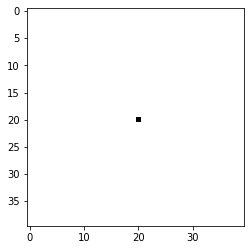

In [6]:
num_channels = 16
seed = np.zeros([1, 40, 40, num_channels], np.float32)
seed[:,40//2, 40//2, 3:] = 1.0
seed_tensor = torch.tensor(seed).permute(0,-1,1,2).to('cuda')

plt.imshow(seed[0,:,:,:4])
plt.show()

## A random seed generator which would determine where the "infection" starts 

torch.Size([10, 1, 40, 40])


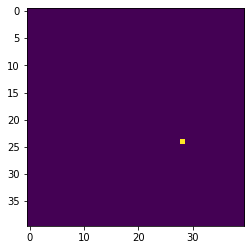

In [13]:
def make_random_infect_seed(height, width, xmax, xmin, ymax, ymin):
    x = random.randint(xmin, xmax)
    y = random.randint(ymin, ymax)
    seed = torch.zeros(1,1,height,width)
    seed[:,:,x,y] = 1.

    return seed

def make_random_infect_seed_batch(batch_size ,height, width, xmax, xmin, ymax, ymin):

    batch = torch.zeros(batch_size, 1, height, width)

    for i in range(batch_size):
        batch[i] = make_random_infect_seed(height, width, xmax, xmin, ymax, ymin)

    return batch

print(make_random_infect_seed_batch(10, 40, 40, 30, 10, 30,10).shape)

plt.imshow( make_random_infect_seed(40, 40, 30, 10, 30,10)[0][0])

In [46]:
target_tensor = load_target_png_as_tensor('coffin.png', device = 'cuda')
bird_tensor = load_target_png_as_tensor('bird.png', device = 'cuda')

model = ca_model(device = 'cuda')
model_bird = ca_model(device = 'cuda', checkpoint = 'nca_bird.pt')

optimizer = optim.Adam(model.parameters(), lr = 1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size= 1000, gamma=0.3) 

losses = []

## Training

In [ ]:
epochs  = 4000
batch_size = 5
target_batch = torch.repeat_interleave(target_tensor, batch_size, dim = 0)

for i in range(epochs):

    seed_from_model = model_bird.inference(seed_tensor = seed_tensor, iters = random.randint(0,150))

    loss, out = model.train_step(
        seed = seed_from_model,
        target = target_batch,
        target_loss_func = F.mse_loss,
        iters = random.randint(30, 60),
        infect = True,
        infect_start_mask = make_random_infect_seed_batch(batch_size = batch_size, height = 40, width =  40, xmax = 30, xmin = 10, ymax = 30, ymin = 10).to('cuda')
    )

    loss.backward()

    model.normalize_grads()

    optimizer.step()
    optimizer.zero_grad()

    losses.append(loss.item())

    if i % 20==0 or i  == epochs-1:
        clear_output(True)

        plt.plot(losses ,'.', alpha = 0.3)
        plt.yscale('log')
        plt.show()

        plt.imshow(np.clip(to_rgb(out[0].permute(-2, -1,0).cpu().detach().numpy()), 0,1))
        plt.show()
        
        print(i, loss.item(), flush = True)




In [30]:
torch.save(model.state_dict(), 'infect_bird_to_coffin.pt')

In [52]:
model_bird = ca_model(device = 'cuda', checkpoint = 'nca_bird.pt')
model.load_state_dict(torch.load('infect_bird_to_coffin.pt'))

num_channels = 16
seed = np.zeros([1, 40, 40, num_channels], np.float32)
seed[:,40//2, 40//2, 3:] = 1.0
seed_tensor = torch.tensor(seed).permute(0,-1,1,2).to('cuda')


model_bird.make_gif(
    seed_tensor = seed_tensor,
    filename = 'bird.gif',
    iters = 100,
    infect = False
)

seed_from_model = model_bird.inference(seed_tensor = seed_tensor, iters = 120)

model.make_gif(
    seed_tensor = seed_from_model, 
    filename = 'infect_bird_coffin.gif',
    iters = 70, 
    infect = True, 
    infect_mask = make_random_infect_seed(40,40, 30,29,30,29).to('cuda')
)

## Battle between the 2 models 

In [43]:
infect_mask = make_random_infect_seed(40,40, 30,29,30,29).to('cuda')

seed_x = torch.tensor(seed).permute(0,-1,1,2).to('cuda')

with imageio.get_writer('bird_vs_coffin.gif', mode='I', duration = 0.001) as writer:
                
    for i in range(100):
        seed_x = model_bird.inference(seed_x, iters= 1)


        im = to_rgb(seed_x[0].permute(-2, -1,0).cpu().detach().numpy())
        im = cv2.resize(im, (512,512), interpolation = cv2.INTER_NEAREST)
        writer.append_data((np.clip(im, 0,1)*255).astype(np.uint8))

    for i in range(100):

        seed_x, infect_mask = model.infect(seed_x, infect_mask)

        im = to_rgb(seed_x[0].permute(-2, -1,0).cpu().detach().numpy())
        im = cv2.resize(im, (512,512), interpolation = cv2.INTER_NEAREST)
        writer.append_data((np.clip(im, 0,1)*255).astype(np.uint8))


    for i in range(200):
        seed_x = model_bird.inference(seed_x, iters= 1)

        im = to_rgb(seed_x[0].permute(-2, -1,0).cpu().detach().numpy())
        im = cv2.resize(im, (512,512), interpolation = cv2.INTER_NEAREST)
        writer.append_data((np.clip(im, 0,1)*255).astype(np.uint8))

writer.close()



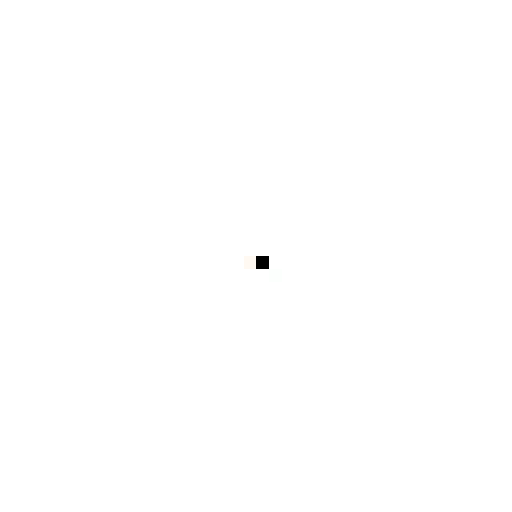

In [53]:
import base64
from IPython import display
def show_gif(fname):
    
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

show_gif('bird.gif')



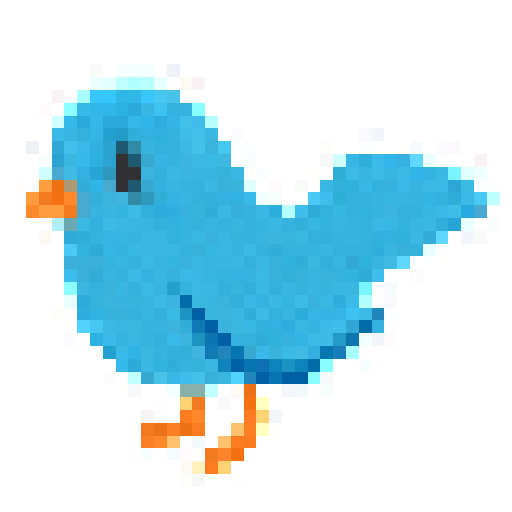

In [54]:
show_gif('infect_bird_coffin.gif')